In [ ]:
!nvidia-smi

Fri Mar 22 08:08:42 2024       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 535.104.05             Driver Version: 535.104.05   CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                 Persistence-M | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla T4                       Off | 00000000:00:04.0 Off |                    0 |
| N/A   53C    P0              27W /  70W |   8321MiB / 15360MiB |      0%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
!pip install tensorflow_io

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.4/49.4 MB 12.0 MB/s eta 0:00:00


In [3]:
import cv2
import math
import matplotlib.pyplot as plt
import numpy as np
import random
import tensorflow as tf
import tensorflow_io as tfio

from glob import glob
from IPython.display import Image
from PIL import Image, ImageOps
from skimage.metrics import structural_similarity as compare_ssim
from skimage.metrics import peak_signal_noise_ratio
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import optimizers
from tensorflow.keras.utils import plot_model

In [ ]:
IMAGE_SIZE = 256
BATCH_SIZE = 15
TRAIN_DATASET = #inset the url here
VAL_DATASET = #inset the url here

In [35]:
train_low_light_images = sorted(glob(TRAIN_DATASET))
test_low_light_images = sorted(glob(VAL_DATASET))

In [ ]:
def load_data(image_path):
    image = tf.io.read_file(image_path)
    image = tf.image.decode_png(image,channels=3)
    image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    image = image / 255.0
    return image


def data_generator(low_light_images):
    dataset = tf.data.Dataset.from_tensor_slices((low_light_images))
    dataset = dataset.map(load_data, num_parallel_calls=tf.data.AUTOTUNE)
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    return dataset

In [ ]:
train_dataset = data_generator(train_low_light_images)
val_dataset = data_generator(val_low_light_images)

print("Train Dataset:", train_dataset)
print("Validation Dataset:", val_dataset)

Train Dataset: <_BatchDataset element_spec=TensorSpec(shape=(15, 256, 256, 3), dtype=tf.float32, name=None)>
Validation Dataset: <_BatchDataset element_spec=TensorSpec(shape=(15, 256, 256, 3), dtype=tf.float32, name=None)>


In [5]:
def build_dce_net():
    input_img = keras.Input(shape=[None, None, 3])
    conv1 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(input_img)
    conv2 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv1)
    conv3 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv2)
    conv4 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(conv3)
    int_con1 = layers.Concatenate(axis=-1)([conv4, conv3])
    conv5 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con1)
    int_con2 = layers.Concatenate(axis=-1)([conv5, conv2])
    conv6 = layers.Conv2D(
        32, (3, 3), strides=(1, 1), activation="relu", padding="same"
    )(int_con2)
    int_con3 = layers.Concatenate(axis=-1)([conv6, conv1])
    x_r = layers.Conv2D(24, (3, 3), strides=(1, 1), activation="tanh", padding="same")(
        int_con3
    )
    return keras.Model(inputs=input_img, outputs=x_r)

In [6]:
dce_net = build_dce_net()
dce_net.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                Output Shape                 Param #   Connected to                  
 input_1 (InputLayer)        [(None, None, None, 3)]      0         []                            
                                                                                                  
 conv2d (Conv2D)             (None, None, None, 32)       896       ['input_1[0][0]']             
                                                                                                  
 conv2d_1 (Conv2D)           (None, None, None, 32)       9248      ['conv2d[0][0]']              
                                                                                                  
 conv2d_2 (Conv2D)           (None, None, None, 32)       9248      ['conv2d_1[0][0]']            
                                                                                              

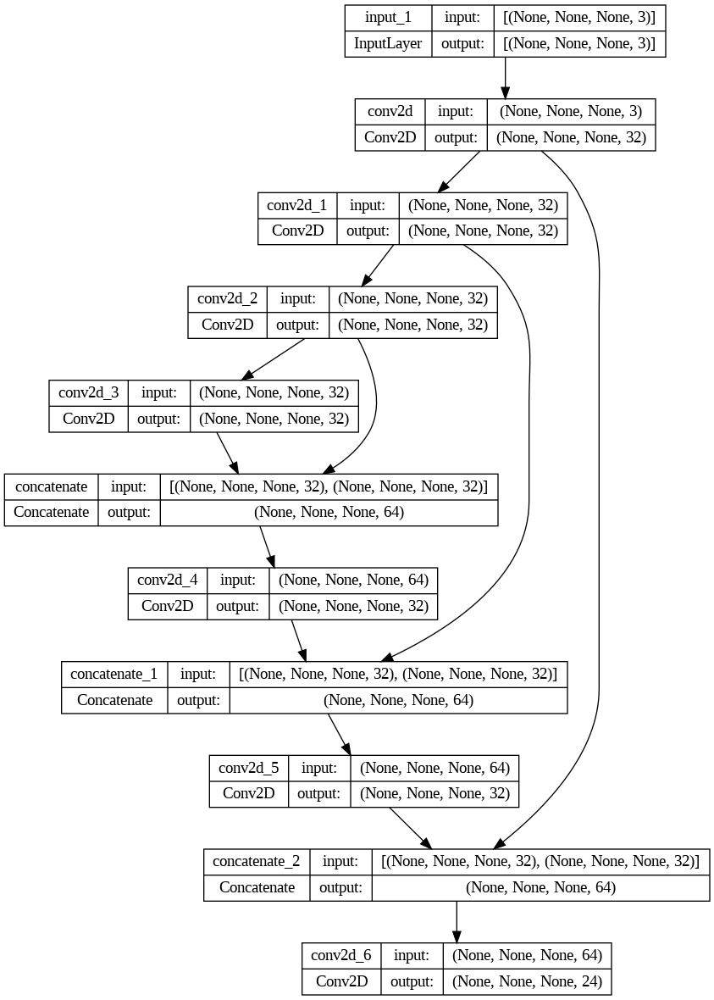

In [8]:
plot_model(dce_net, show_shapes =True, show_layer_names=True)

In [ ]:
def color_constancy_loss(x):
    mean_rgb = tf.reduce_mean(x, axis=(1, 2), keepdims=True)
    mr, mg, mb = mean_rgb[:, :, :, 0], mean_rgb[:, :, :, 1], mean_rgb[:, :, :, 2]
    d_rg = tf.square(mr - mg)
    d_rb = tf.square(mr - mb)
    d_gb = tf.square(mb - mg)
    return tf.sqrt(tf.square(d_rg) + tf.square(d_rb) + tf.square(d_gb))

In [ ]:
def exposure_loss(x, mean_val=0.6):
    x = tf.reduce_mean(x, axis=3, keepdims=True)
    mean = tf.nn.avg_pool2d(x, ksize=16, strides=16, padding="VALID")
    return tf.reduce_mean(tf.square(mean - mean_val))

In [ ]:
def illumination_smoothness_loss(x):
    batch_size = tf.shape(x)[0]
    h_x = tf.shape(x)[1]
    w_x = tf.shape(x)[2]
    count_h = (tf.shape(x)[2] - 1) * tf.shape(x)[3]
    count_w = tf.shape(x)[2] * (tf.shape(x)[3] - 1)
    h_tv = tf.reduce_sum(tf.square((x[:, 1:, :, :] - x[:, : h_x - 1, :, :])))
    w_tv = tf.reduce_sum(tf.square((x[:, :, 1:, :] - x[:, :, : w_x - 1, :])))
    batch_size = tf.cast(batch_size, dtype=tf.float32)
    count_h = tf.cast(count_h, dtype=tf.float32)
    count_w = tf.cast(count_w, dtype=tf.float32)
    return 2 * (h_tv / count_h + w_tv / count_w) / batch_size

In [ ]:
class SpatialConsistencyLoss(keras.losses.Loss):
    def __init__(self, **kwargs):
        super().__init__(reduction="none")

        self.left_kernel = tf.constant(
            [[[[0, 0, 0]], [[-1, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.right_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, -1]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.up_kernel = tf.constant(
            [[[[0, -1, 0]], [[0, 1, 0]], [[0, 0, 0]]]], dtype=tf.float32
        )
        self.down_kernel = tf.constant(
            [[[[0, 0, 0]], [[0, 1, 0]], [[0, -1, 0]]]], dtype=tf.float32
        )

    def call(self, y_true, y_pred):

        original_mean = tf.reduce_mean(y_true, 3, keepdims=True)
        enhanced_mean = tf.reduce_mean(y_pred, 3, keepdims=True)
        original_pool = tf.nn.avg_pool2d(
            original_mean, ksize=4, strides=4, padding="VALID"
        )
        enhanced_pool = tf.nn.avg_pool2d(
            enhanced_mean, ksize=4, strides=4, padding="VALID"
        )

        d_original_left = tf.nn.conv2d(
            original_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_right = tf.nn.conv2d(
            original_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_up = tf.nn.conv2d(
            original_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_original_down = tf.nn.conv2d(
            original_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_enhanced_left = tf.nn.conv2d(
            enhanced_pool, self.left_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_right = tf.nn.conv2d(
            enhanced_pool, self.right_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_up = tf.nn.conv2d(
            enhanced_pool, self.up_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )
        d_enhanced_down = tf.nn.conv2d(
            enhanced_pool, self.down_kernel, strides=[1, 1, 1, 1], padding="SAME"
        )

        d_left = tf.square(d_original_left - d_enhanced_left)
        d_right = tf.square(d_original_right - d_enhanced_right)
        d_up = tf.square(d_original_up - d_enhanced_up)
        d_down = tf.square(d_original_down - d_enhanced_down)
        return d_left + d_right + d_up + d_down

In [ ]:
class ZeroDCE(keras.Model):
    def __init__(self, **kwargs):
        super(ZeroDCE, self).__init__(**kwargs)
        self.dce_model = build_dce_net()

    def compile(self, learning_rate, **kwargs):
        super(ZeroDCE, self).compile(**kwargs)
        self.optimizer = optimizers.Adam(learning_rate=learning_rate)
        self.spatial_constancy_loss = SpatialConsistencyLoss(reduction="none")

    def summary(self, *args, **kwargs):
        self.dce_model.summary(*args, **kwargs)

    def get_enhanced_image(self, data, output):
        x = data
        for i in range(0, 3 * 8, 3):
            r = output[:, :, :, i: i + 3]
            x = x + r * (tf.square(x) - x)
        return x

    def call(self, data):
        dce_net_output = self.dce_model(data)
        return self.get_enhanced_image(data, dce_net_output)

    def compute_losses(self, data, output):
        enhanced_image = self.get_enhanced_image(data, output)
        loss_illumination = 200 * illumination_smoothness_loss(output)
        loss_spatial_constancy = tf.reduce_mean(
            self.spatial_constancy_loss(enhanced_image, data)
        )
        loss_color_constancy = 5 * tf.reduce_mean(color_constancy_loss(enhanced_image))
        loss_exposure = 10 * tf.reduce_mean(exposure_loss(enhanced_image))
        total_loss = (
            loss_illumination
            + loss_spatial_constancy
            + loss_color_constancy
            + loss_exposure
        )
        return {
            "total_loss": total_loss,
            "illumination_smoothness_loss": loss_illumination,
            "spatial_constancy_loss": loss_spatial_constancy,
            "color_constancy_loss": loss_color_constancy,
            "exposure_loss": loss_exposure,
        }

    def train_step(self, data):
        with tf.GradientTape() as tape:
            output = self.dce_model(data)
            losses = self.compute_losses(data, output)
        gradients = tape.gradient(
            losses["total_loss"], self.dce_model.trainable_weights
        )
        self.optimizer.apply_gradients(zip(gradients, self.dce_model.trainable_weights))
        return losses

    def test_step(self, data):
        output = self.dce_model(data)
        return self.compute_losses(data, output)

    def save_weights(self, filepath, overwrite=True, save_format=None, options=None):
        self.dce_model.save_weights(
            filepath, overwrite=overwrite, save_format=save_format, options=options
        )

    def load_weights(self, filepath, by_name=False, skip_mismatch=False, options=None):
        self.dce_model.load_weights(
            filepath=filepath,
            by_name=by_name,
            skip_mismatch=skip_mismatch,
            options=options,
        )

In [ ]:
zero_dce_model = ZeroDCE()
zero_dce_model.compile(learning_rate=1e-4)
history = zero_dce_model.fit(train_dataset, validation_data=val_dataset, epochs=20)


def plot_result(item):
    plt.plot(history.history[item], label=item)
    plt.plot(history.history["val_" + item], label="val_" + item)
    plt.xlabel("Epochs")
    plt.ylabel(item)
    plt.title("Train and Validation {} Over Epochs".format(item), fontsize=14)
    plt.legend()
    plt.grid()
    plt.show()


Epoch 1/20
26/26 [==============================] - 661s 25s/step - total_loss: 5.2124 - illumination_smoothness_loss: 2.2428 - spatial_constancy_loss: 5.8460e-06 - color_constancy_loss: 0.0034 - exposure_loss: 2.9663 - val_total_loss: 4.9736 - val_illumination_smoothness_loss: 1.8268 - val_spatial_constancy_loss: 1.2777e-06 - val_color_constancy_loss: 4.4671e-04 - val_exposure_loss: 3.1463
Epoch 2/20
26/26 [==============================] - 631s 24s/step - total_loss: 4.3149 - illumination_smoothness_loss: 1.3618 - spatial_constancy_loss: 4.1173e-06 - color_constancy_loss: 0.0032 - exposure_loss: 2.9499 - val_total_loss: 4.2428 - val_illumination_smoothness_loss: 1.1069 - val_spatial_constancy_loss: 6.4388e-06 - val_color_constancy_loss: 4.4212e-04 - val_exposure_loss: 3.1355
Epoch 3/20
26/26 [==============================] - 623s 24s/step - total_loss: 3.8312 - illumination_smoothness_loss: 0.8935 - spatial_constancy_loss: 2.0017e-05 - color_constancy_loss: 0.0032 - exposure_loss: 2

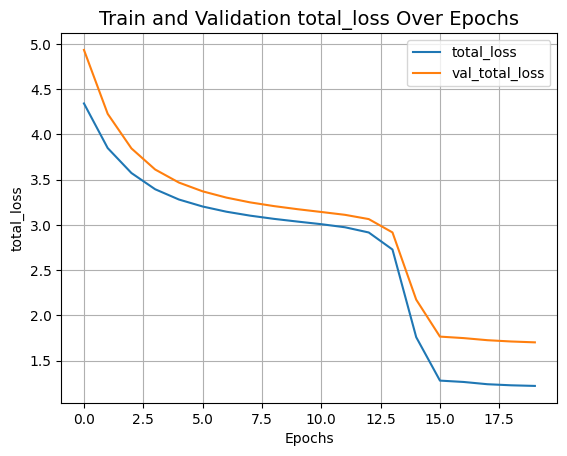

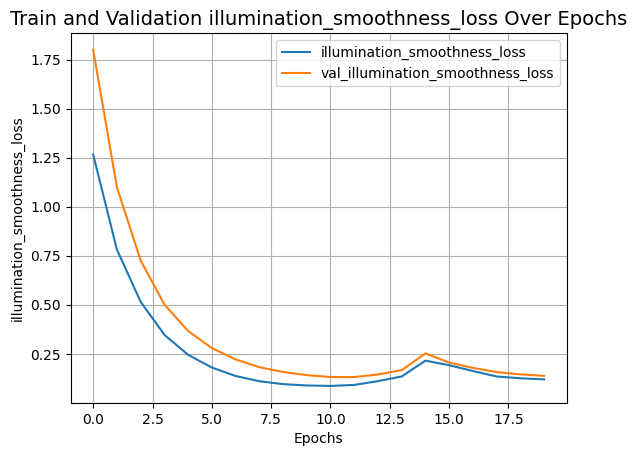

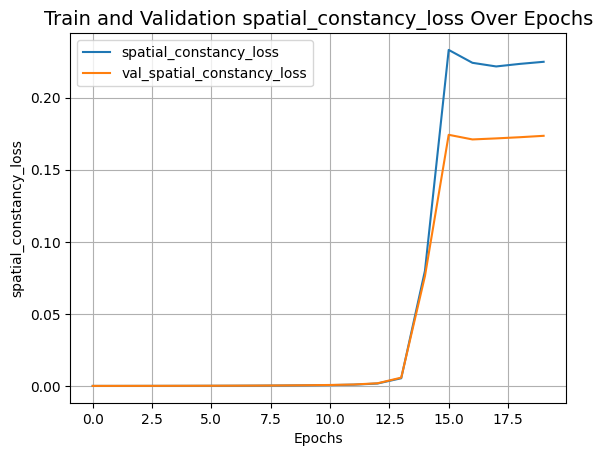

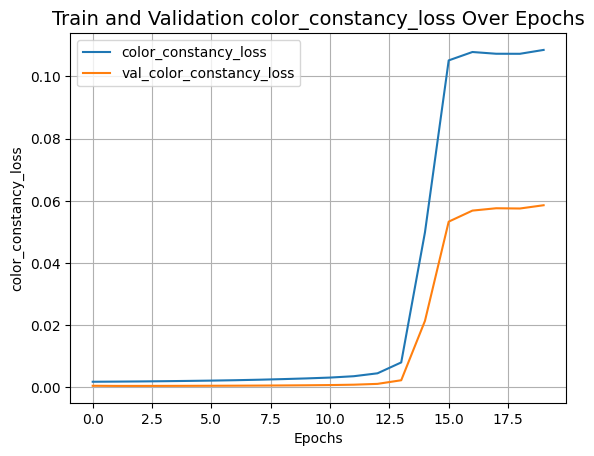

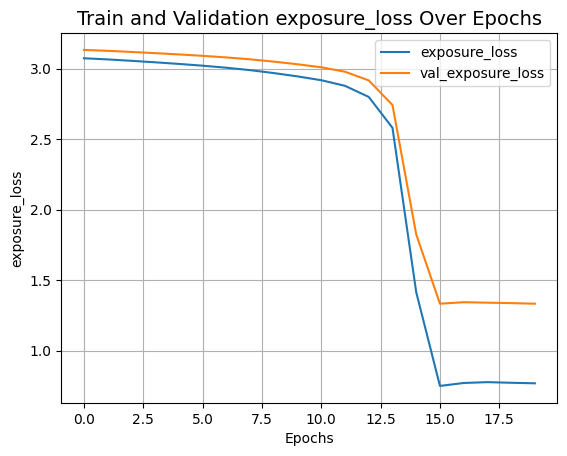

In [34]:
plot_result("total_loss")
plot_result("illumination_smoothness_loss")
plot_result("spatial_constancy_loss")
plot_result("color_constancy_loss")
plot_result("exposure_loss")

In [32]:
def plot_results(images, titles, figure_size=(12, 12)):
    fig = plt.figure(figsize=figure_size)
    for i in range(len(images)):
        fig.add_subplot(1, len(images), i + 1).set_title(titles[i])
        _ = plt.imshow(images[i])
        plt.axis("off")
    plt.show()


def infer(original_image):
    image = keras.preprocessing.image.img_to_array(original_image)
    image = image.astype("float32") / 255.0
    image = np.expand_dims(image, axis=0)
    output_image = zero_dce_model(image)
    output_image = tf.cast((output_image[0, :, :, :] * 255), dtype=np.uint8)
    output_image = Image.fromarray(output_image.numpy())
    return output_image

In [ ]:
average_psnr = 0

for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    enhanced_image = infer(original_image)

    original_image = np.array(original_image).astype(np.float32)
    enhanced_image = np.array(enhanced_image).astype(np.float32)
    ssim = compare_ssim(original_image, enhanced_image, multichannel=True)

    mse = np.mean((original_image - enhanced_image) ** 2)
    max_pixel_value = np.max(original_image)
    psnr = 20 * np.log10(max_pixel_value / np.sqrt(mse))

    original_image = Image.fromarray(np.uint8(original_image))
    enhanced_image = Image.fromarray(np.uint8(enhanced_image))

    average_psnr += psnr

average_psnr = average_psnr/15
print(average_psnr)

<ipython-input-31-10e5d204d745>:9: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = compare_ssim(original_image, enhanced_image, multichannel=True)


0.049639309446016945


In [ ]:
average_ssim = 0

for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    enhanced_image = infer(original_image)

    original_image = np.array(original_image).astype(np.float32)
    enhanced_image = np.array(enhanced_image).astype(np.float32)
    ssim = compare_ssim(original_image, enhanced_image, multichannel=True)

    average_ssim += ssim

average_ssim = average_ssim/15
print(average_ssim)

<ipython-input-30-f417b7c999b6>:9: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = compare_ssim(original_image, enhanced_image, multichannel=True)


0.09408848931392035


<ipython-input-23-6351c0490a3b>:7: FutureWarning: `multichannel` is a deprecated argument name for `structural_similarity`. It will be removed in version 1.0. Please use `channel_axis` instead.
  ssim = compare_ssim(original_image, enhanced_image, multichannel=True)


SSIM: 0.14
PSNR: -0.63 dB
Mean Square Error: 15557.694336 db


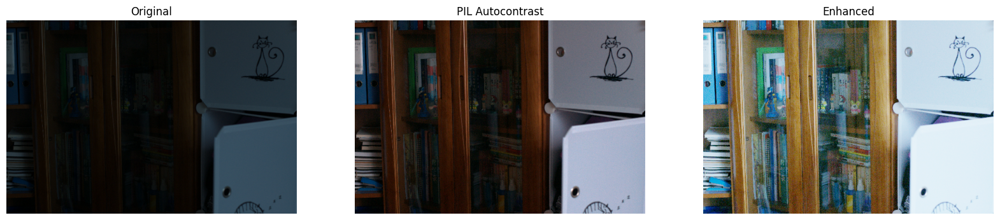

SSIM: 0.12
PSNR: 0.83 dB
Mean Square Error: 19324.019531 db


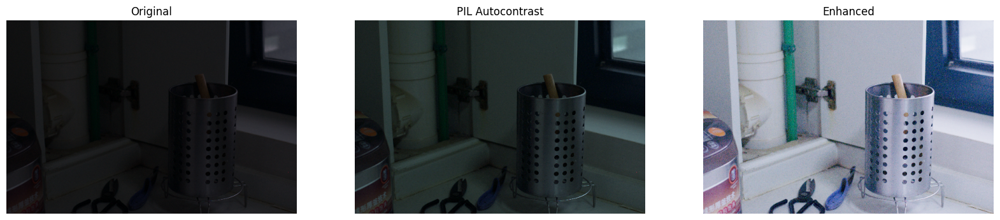

SSIM: 0.17
PSNR: 2.27 dB
Mean Square Error: 21836.160156 db


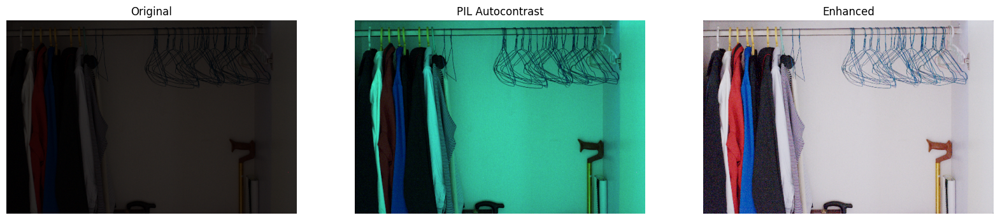

SSIM: 0.13
PSNR: 0.65 dB
Mean Square Error: 19391.466797 db


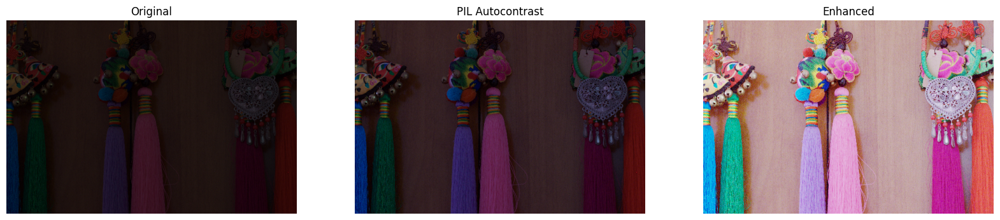

SSIM: 0.14
PSNR: -4.68 dB
Mean Square Error: 17872.326172 db


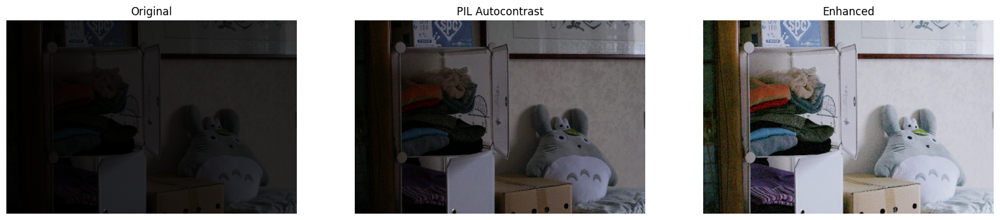

SSIM: 0.05
PSNR: -3.30 dB
Mean Square Error: 9896.576172 db


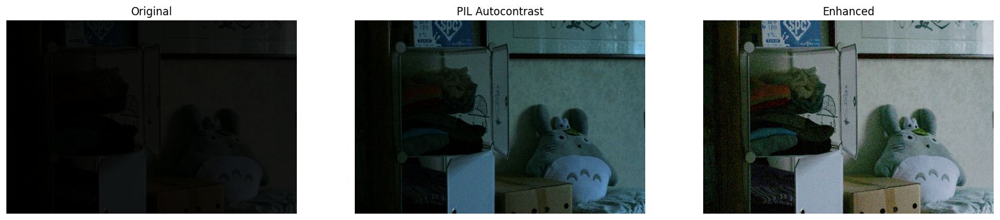

SSIM: 0.05
PSNR: -5.97 dB
Mean Square Error: 6638.862793 db


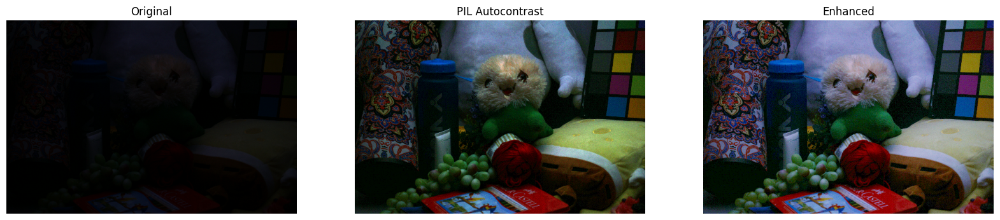

SSIM: 0.09
PSNR: -7.52 dB
Mean Square Error: 16456.695312 db


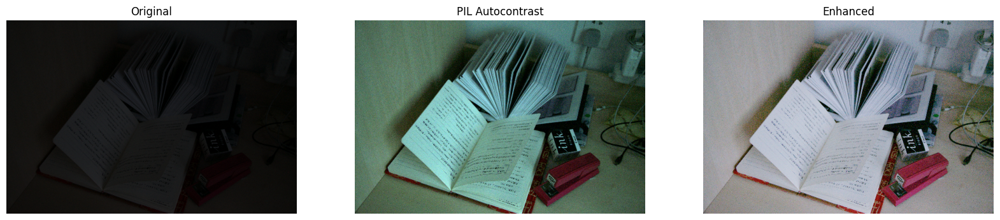

SSIM: 0.05
PSNR: -3.73 dB
Mean Square Error: 9661.371094 db


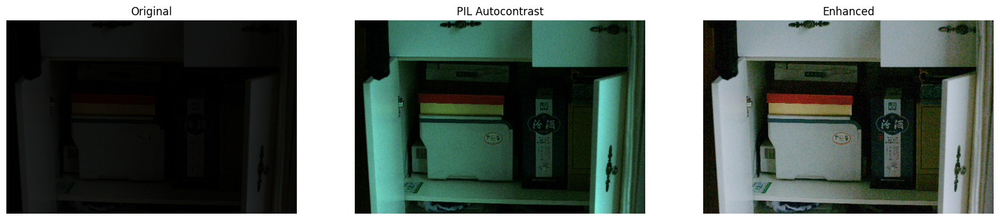

SSIM: 0.04
PSNR: 3.67 dB
Mean Square Error: 7594.985352 db


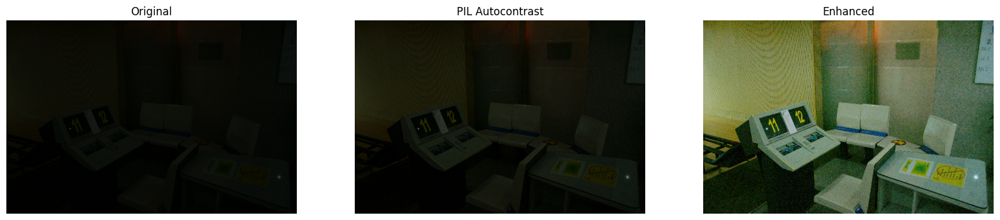

SSIM: 0.10
PSNR: -5.41 dB
Mean Square Error: 17504.777344 db


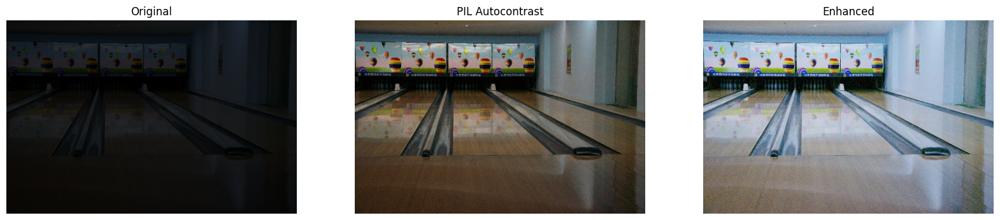

SSIM: 0.07
PSNR: 7.00 dB
Mean Square Error: 12964.868164 db


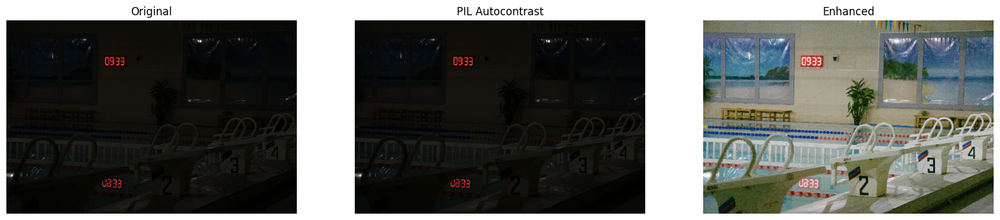

SSIM: 0.04
PSNR: 8.72 dB
Mean Square Error: 7286.460938 db


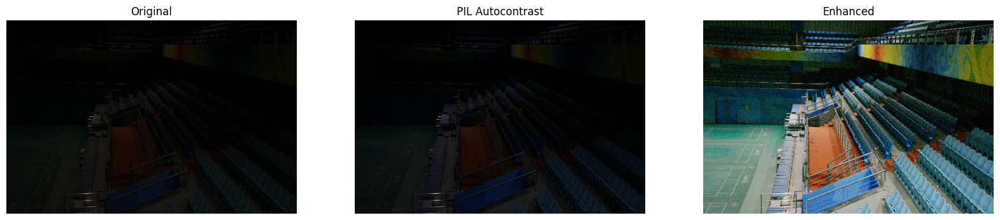

SSIM: 0.06
PSNR: 3.98 dB
Mean Square Error: 10117.114258 db


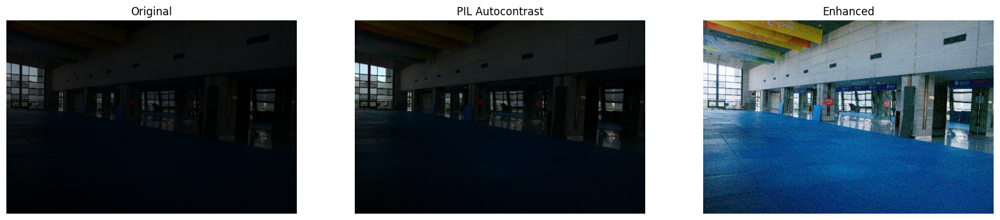

SSIM: 0.15
PSNR: 4.85 dB
Mean Square Error: 21302.867188 db


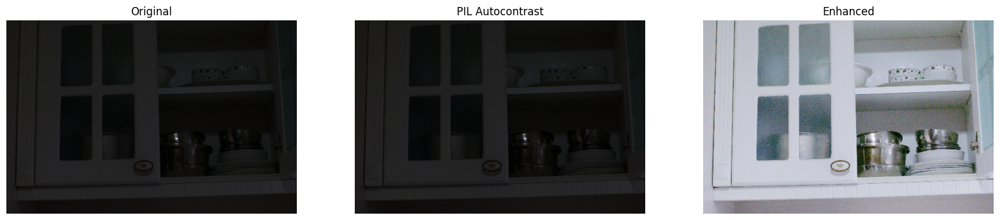

In [ ]:
for val_image_file in test_low_light_images:
    original_image = Image.open(val_image_file)
    enhanced_image = infer(original_image)

    original_image = np.array(original_image).astype(np.float32)
    enhanced_image = np.array(enhanced_image).astype(np.float32)
    ssim = compare_ssim(original_image, enhanced_image, multichannel=True)

    print(f"SSIM: {ssim:.2f}")

    mse = np.mean((original_image - enhanced_image) ** 2)
    max_pixel_value = np.max(original_image)
    psnr = 20 * np.log10(max_pixel_value / np.sqrt(mse))



    print(f"PSNR: {psnr:.2f} dB")
    print(f"Mean Square Error: {mse:2f} db")

    original_image = Image.fromarray(np.uint8(original_image))
    enhanced_image = Image.fromarray(np.uint8(enhanced_image))

    plot_results(
        [original_image, ImageOps.autocontrast(original_image), enhanced_image],
        ["Original", "PIL Autocontrast", "Enhanced"],
        (20, 12),
    )
